In [17]:
import numpy as np 
import pandas as pd
import random

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#sklearn imports
from sklearn import preprocessing
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

import tensorflow as tf
from tensorflow.keras.utils import to_categorical

In [3]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
wine_quality = fetch_ucirepo(id=186) 

df = pd.DataFrame(wine_quality.data.original)

#set seeds to get reproducible results
np.random.seed(3)
random.seed(3)
tf.random.set_seed(3)

df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


In [81]:
# Initialize LabelEncoder
le = LabelEncoder()

res_df = df.copy()
    
# Columns to encode
columns_to_encode = ['sulphates', 'total_sulfur_dioxide', 'residual_sugar', 'pH',
                     'chlorides', 'density', 'citric_acid', 'fixed_acidity', 'volatile_acidity', 'free_sulfur_dioxide', 'color', 'quality']

# Encode categorical features using LabelEncoder and add labels
label_mapping = {column: {label: idx for idx, label in enumerate(le.fit_transform(res_df[column]))} 
                 for column in columns_to_encode}

# Update res_df with encoded values and labels
for column in columns_to_encode:
    res_df[f'{column}'] = le.fit_transform(res_df[column])

res_df = res_df.drop(columns = ['quality', 'color'])
later_df = res_df.drop(columns = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'chlorides', 'free_sulfur_dioxide', 'pH', 'sulphates', 'alcohol'])
res_df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,36,117,0,23,65,11,28,823,74,33,9.4
1,40,153,0,36,87,29,61,735,43,45,9.8
2,40,129,4,31,81,16,48,755,49,42,9.8
3,74,38,56,23,64,19,54,838,39,35,9.8
4,36,117,0,23,65,11,28,823,74,33,9.4
...,...,...,...,...,...,...,...,...,...,...,...
6492,22,24,29,17,28,28,87,224,50,27,11.2
6493,27,46,36,126,36,76,167,556,38,23,9.6
6494,26,30,19,9,30,35,106,348,22,23,9.4
6495,14,40,30,7,11,23,105,29,57,15,12.8


In [59]:
X = np.asarray(res_df)
print(X)

[[ 36.  117.    0.  ...  74.   33.    9.4]
 [ 40.  153.    0.  ...  43.   45.    9.8]
 [ 40.  129.    4.  ...  49.   42.    9.8]
 ...
 [ 26.   30.   19.  ...  22.   23.    9.4]
 [ 14.   40.   30.  ...  57.   15.   12.8]
 [ 19.   24.   38.  ...  49.    9.   11.8]]


In [60]:
# Create DBSCAN model
dbscan = DBSCAN(eps=0.5, min_samples=5)

# Fit the model to your data
dbscan.fit(X)

# Get cluster labels
cluster_labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_noise_ = list(cluster_labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 14
Estimated number of noise points: 6413


/var/folders/_f/16zx57b1111fd3hmtt8wdx040000gn/T/ipykernel_15226/2518150402.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(3, 3))


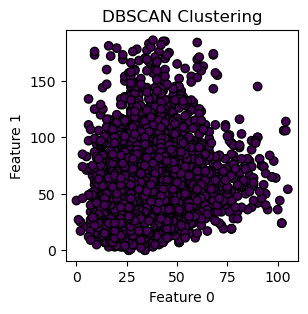

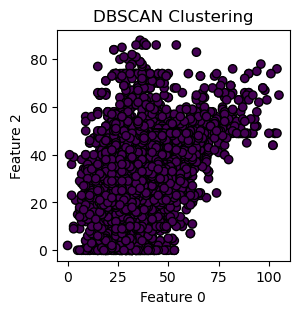

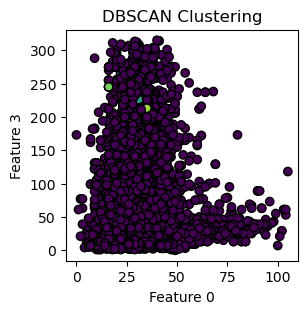

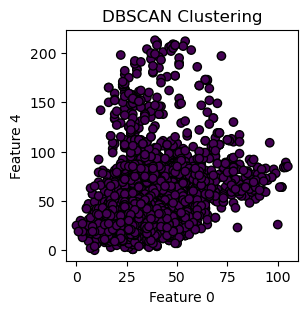

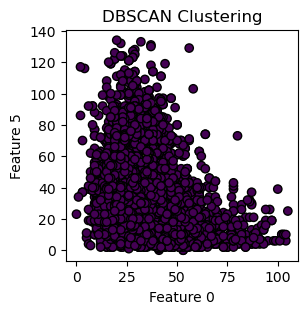

...

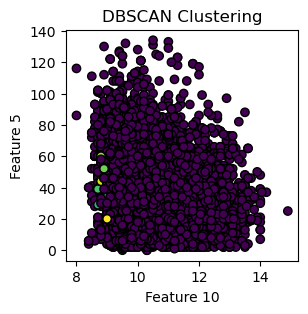

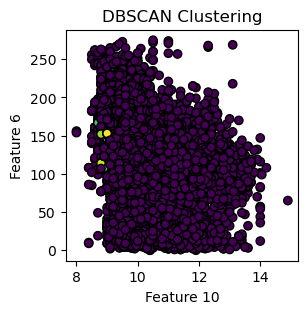

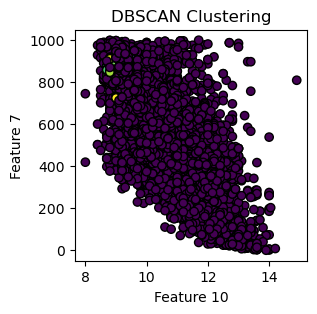

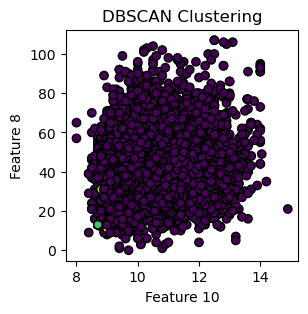

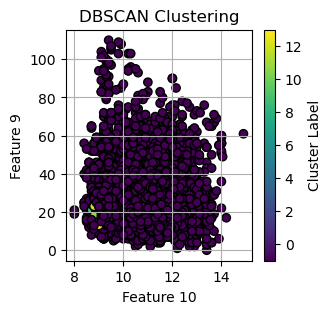

In [63]:
# Plot the data points with cluster labels
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        if i != j:
            plt.figure(figsize=(3, 3))
            plt.scatter(X[:, i], X[:, j], c=cluster_labels, cmap='viridis', marker='o', edgecolors='k')
            plt.title('DBSCAN Clustering')
            plt.xlabel(f'Feature {i}')
            plt.ylabel(f'Feature {j}')

# Add legend
plt.colorbar(label='Cluster Label')
plt.grid(True)
plt.show()

In [78]:
# Calculate centroid or mean values for each cluster for each feature
cluster_means = np.zeros((n_clusters_, X.shape[1]))

for cluster_label in range(n_clusters_):
    cluster_means[cluster_label] = np.mean(X[cluster_labels == cluster_label], axis=0)
    
print("Cluster Means:")
print(cluster_means)
    
# Analyze the difference in means or centroids between clusters to determine feature importance
feature_importance = np.abs(cluster_means[1:] - cluster_means[:-1])
print("  ")
print("Feature Importance")
print(feature_importance)

# Calculate the average of each entry at each index across all arrays within feature_importance
average_feature_importance = np.mean(feature_importance, axis=0)
print("  ")
print("Average Feature Importance")
print(average_feature_importance)

top_three_indices = np.argsort(average_feature_importance)[-3:]

print(" ")
print("Top three most important features:")
print(top_three_indices)

Cluster Means:
[[ 38.   22.   30.  218.   45.   72.  214.  905.   37.   23.    8.9]
 [ 36.   21.   30.  198.   42.   64.  235.  885.   37.   26.    9.1]
 [ 36.   48.   26.  240.   38.   90.  211.  910.   29.   45.    9.5]
 [ 29.   19.   30.  198.   51.   21.  170.  846.   23.   29.    9. ]
 [ 22.   28.   36.  265.   28.   44.  127.  933.   46.   20.    8.8]
 [ 36.   21.   31.  223.   34.   48.  194.  885.   33.   27.    9.2]
 [ 37.   30.   31.  202.   39.   30.  180.  897.   28.   30.    9.1]
 [ 31.   13.   28.  226.   40.   34.  146.  833.   19.   16.    9. ]
 [ 36.   15.   27.  238.   39.   29.  132.  871.   13.   20.    8.7]
 [ 36.   15.   30.  211.   45.   39.  167.  856.   13.   21.    8.7]
 [ 16.   26.   20.  245.   33.   52.  108.  886.   45.   23.    8.9]
 [ 35.   21.   27.  213.   46.   60.  152.  845.   17.   18.    8.8]
 [ 27.   26.   23.  266.   36.   44.  114.  909.   31.   23.    8.8]
 [ 28.   15.   32.  193.   24.   20.  153.  723.   11.   13.    9. ]]
  
Feature Importa

This corresponds to residual sugar, total sulfur dioxide, and density --> let's try running the model again with only these features to see if we can get clusters representing quality.

In [89]:
X = np.asarray(later_df)
print(X)

# Create DBSCAN model
dbscan = DBSCAN(eps=0.5, min_samples=5)

# Fit the model to your data
dbscan.fit(X)

# Get cluster labels
cluster_labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_noise_ = list(cluster_labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

[[ 23  28 823]
 [ 36  61 735]
 [ 31  48 755]
 ...
 [  9 106 348]
 [  7 105  29]
 [  2  93  74]]
Estimated number of clusters: 14
Estimated number of noise points: 6413


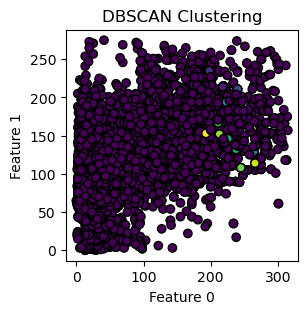

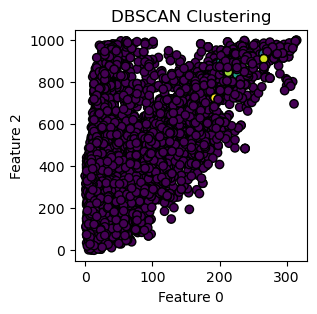

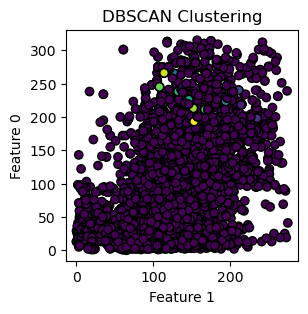

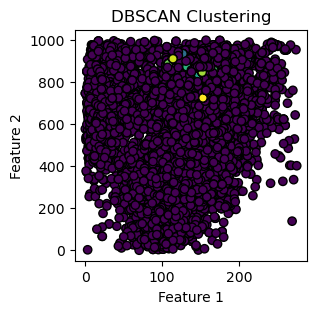

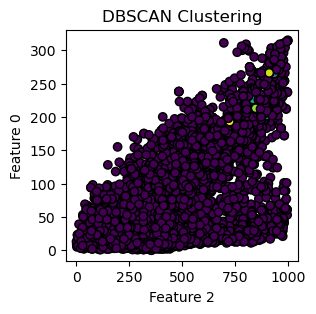

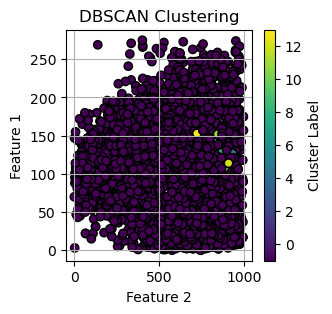

In [90]:
# Plot the data points with cluster labels
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        if i != j:
            plt.figure(figsize=(3, 3))
            plt.scatter(X[:, i], X[:, j], c=cluster_labels, cmap='viridis', marker='o', edgecolors='k')
            plt.title('DBSCAN Clustering')
            plt.xlabel(f'Feature {i}')
            plt.ylabel(f'Feature {j}')

# Add legend
plt.colorbar(label='Cluster Label')
plt.grid(True)
plt.show()

This made no difference.